In [34]:
import re
import warnings
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from sklearn.preprocessing import MinMaxScaler
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud, STOPWORDS
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv("../data/origin/mbti_1.csv")
data

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...
...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...
8671,ENFP,'So...if this thread already exists someplace ...
8672,INTP,'So many questions when i do these things. I ...
8673,INFP,'I am very conflicted right now when it comes ...


In [ ]:
data.type.value_counts()

In [4]:
px.pie(data, names="type", title="MBTI Personality Types Distribution", hole=0.25)

## V1.0

In [5]:
# Extract the 4 binary orthogonal dimensions of MBTI personalities
data["is_E"] = data["type"].apply(lambda x: 1 if x[0] == "E" else 0)
data["is_N"] = data["type"].apply(lambda x: 1 if x[1] == "N" else 0)
data["is_F"] = data["type"].apply(lambda x: 1 if x[2] == "F" else 0)
data["is_J"] = data["type"].apply(lambda x: 1 if x[3] == "J" else 0)
data = data[['type', 'is_E', 'is_N', 'is_F', 'is_J', 'posts']]

In [6]:
# Convert to lower case
data["cleans"] = data["posts"].str.lower()
# Remove "|||"
data["cleans"] = data["cleans"].str.replace(re.compile(r"\|\|\|"), " ")
# Remove all urls and emails
data["cleans"] = data["cleans"].str.replace(
    re.compile(r"((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*"), ""
)
# Remove all punctuations
data["cleans"] = data["cleans"].str.replace(re.compile(r"[^a-z0-9\s]"), " ")

In [7]:
# Add 4 Sentiment features: compound_sentiment, positive_sentiment, negative_sentiment and neutral_sentiment
analyzer = SentimentIntensityAnalyzer()
sentiment_scores = []
for text in data["cleans"]:
    score = analyzer.polarity_scores(text)
    sentiment_scores.append(score)
data["com_stmt"] = [score["compound"] for score in sentiment_scores]
data["pos_stmt"] = [score["pos"] for score in sentiment_scores]
data["neg_stmt"] = [score["neg"] for score in sentiment_scores]
data["neu_stmt"] = [score["neu"] for score in sentiment_scores]

# Use the following code to transform all negative values, if you consider using Naïve Bayes Model.
# scaler = MinMaxScaler()
# data["com_stmt"] = scaler.fit_transform(np.array(data["com_stmt"]).reshape(-1, 1))
# data["pos_stmt"] = scaler.fit_transform(np.array(data["pos_stmt"]).reshape(-1, 1))
# data["neg_stmt"] = scaler.fit_transform(np.array(data["neg_stmt"]).reshape(-1, 1))
# data["neu_stmt"] = scaler.fit_transform(np.array(data["neu_stmt"]).reshape(-1, 1))

In [8]:
# Extract proportioned numbers on the following dimensions:
# word count, unique word count, emoji count, question mark count, exclamation mark count, ellipsis mark count,
# all upper-cased word count, url count, image count.
def unique_words(text):
    unique = set(text.split(" "))
    return len(unique) / 100

def emojis(text):
    emoji_count = 0
    words = text.split()
    for e in words:
        if "http" not in e:
            if e.count(":") == 2:
                emoji_count += 1
    return emoji_count / 100

def ellipse(text):
    return len(re.findall(r"\.\.\.\ ", text)) / 100

def images(text):
    return len(re.findall(r"(\.jpg)|(\.jpeg)|(\.gif)|(\.png)", text)) / 100

data["word_count"] = data["posts"].apply(lambda x: (x.count(" ") + 1) / 100)
data["unique_count"] = data["posts"].apply(unique_words)
data["emoji_count"] = data["posts"].apply(emojis)
data["qe_mark"] = data["posts"].apply(lambda x: x.count("?") / 100)
data["ex_mark"] = data["posts"].apply(lambda x: x.count("!") / 100)
data["el_mark"] = data["posts"].apply(ellipse)
data["upper_count"] = data["posts"].apply(lambda x: len([x for x in x.split() if x.isupper()]) / 100)
data["url_count"] = data["posts"].apply(lambda x: x.count("http") / 100)
data["img_count"] = data["posts"].apply(images)
data.to_csv("../data/clean/mbti_2.csv")

## V1.1

In [9]:
post, stop = data.cleans.copy(), stopwords.words("english")
stemmer = SnowballStemmer(language = "english")
post = [p.split() for p in post]
post = [[w.strip() for w in p] for p in post]
post = [[stemmer.stem(w) for w in p] for p in post]
post = [[w for w in p if w not in stop] for p in post]
post = [" ".join(p) for p in post]
data["cleans"] = post

In [10]:
vectorizer = CountVectorizer(decode_error="ignore", min_df=30, max_df=0.5)
tmp = vectorizer.fit_transform(data["cleans"]).toarray()
vec_data = pd.DataFrame(data=tmp, columns=vectorizer.get_feature_names()).iloc[:, 191:]

In [11]:
new_data = pd.concat([data, vec_data], axis=1).iloc[: , 1:]
new_data.to_csv("../data/clean/mbti_3.csv", index=False)

## V1.2

In [12]:
MBTI_ratio = {
    "INFP": 0.044, "INFJ": 0.015, "INTP": 0.033, "INTJ": 0.021,
    "ENTP": 0.032, "ENFP": 0.081, "ISTP": 0.054, "ISFP": 0.088,
    "ENTJ": 0.018, "ISTJ": 0.116, "ENFJ": 0.025, "ISFJ": 0.138,
    "ESTP": 0.043, "ESFP": 0.085, "ESFJ": 0.123, "ESTJ": 0.087
}

In [14]:
data = pd.read_csv("../data/origin/mbti_1.csv")
mbti_count = data.type.value_counts().to_dict()
mbti_count

{'INFP': 1832,
 'INFJ': 1470,
 'INTP': 1304,
 'INTJ': 1091,
 'ENTP': 685,
 'ENFP': 675,
 'ISTP': 337,
 'ISFP': 271,
 'ENTJ': 231,
 'ISTJ': 205,
 'ENFJ': 190,
 'ISFJ': 166,
 'ESTP': 89,
 'ESFP': 48,
 'ESFJ': 42,
 'ESTJ': 39}

In [15]:
def truncate_data(df, label, number=39):
    tar = df[df["type"] == label].posts.str.len().sort_values(ascending=False).iloc[:number].index
    return df.loc[tar]

infp = truncate_data(data, "INFP")
infj = truncate_data(data, "INFJ")
intp = truncate_data(data, "INTP")
intj = truncate_data(data, "INTJ")
entp = truncate_data(data, "ENTP")
enfp = truncate_data(data, "ENFP")
istp = truncate_data(data, "ISTP")
isfp = truncate_data(data, "ISFP")
entj = truncate_data(data, "ENTJ")
istj = truncate_data(data, "ISTJ")
enfj = truncate_data(data, "ENFJ")
isfj = truncate_data(data, "ISFJ")
estp = truncate_data(data, "ESTP")
esfp = truncate_data(data, "ESFP")
esfj = truncate_data(data, "ESFJ")
estj = truncate_data(data, "ESTJ")
full_data = pd.concat([infp, infj, intp, intj, entp, enfp, istp, isfp, entj, isfj, estp, esfp, esfj, estj, istj, enfj])

In [16]:
px.pie(full_data, names="type", title="MBTI Personality Types Distribution", hole=0.25)

In [17]:
data = full_data
data = data.reset_index().drop(["index"], axis=1)
data

,type,posts
0,INFP,"'probably chiming in real late, but if he's an..."
1,INFP,'I really like the way you put that. It makes ...
2,INFP,'I thought this article was very enlightening....
3,INFP,'I am an INFP and that sounds way too stereoty...
4,INFP,"'I don't really relate to most of it, to be ho..."
...,...,...
619,ENFJ,'Hey all! Jeez I'm still having laptop issues!...
620,ENFJ,'One of my biggest turn-off's and I think its ...
621,ENFJ,"'Dear Universe, We had a fight last night. B..."
622,ENFJ,"'Hm, I think it's been a bit too long since I ..."


In [18]:
data["is_E"] = data["type"].apply(lambda x: 1 if x[0] == "E" else 0)
data["is_N"] = data["type"].apply(lambda x: 1 if x[1] == "N" else 0)
data["is_F"] = data["type"].apply(lambda x: 1 if x[2] == "F" else 0)
data["is_J"] = data["type"].apply(lambda x: 1 if x[3] == "J" else 0)
data = data[['type', 'is_E', 'is_N', 'is_F', 'is_J', 'posts']]
data["cleans"] = data["posts"].str.lower()
data["cleans"] = data["cleans"].str.replace(re.compile(r"\|\|\|"), " ")
data["cleans"] = data["cleans"].str.replace(
    re.compile(r"((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*"), ""
)
data["cleans"] = data["cleans"].str.replace(re.compile(r"[^a-z0-9\s]"), " ")

In [19]:
analyzer = SentimentIntensityAnalyzer()
sentiment_scores = []
for text in data["cleans"]:
    score = analyzer.polarity_scores(text)
    sentiment_scores.append(score)
data["com_stmt"] = [score["compound"] for score in sentiment_scores]
data["pos_stmt"] = [score["pos"] for score in sentiment_scores]
data["neg_stmt"] = [score["neg"] for score in sentiment_scores]
data["neu_stmt"] = [score["neu"] for score in sentiment_scores]

In [20]:
def unique_words(text):
    unique = set(text.split(" "))
    return len(unique) / 100

def emojis(text):
    emoji_count = 0
    words = text.split()
    for e in words:
        if "http" not in e:
            if e.count(":") == 2:
                emoji_count += 1
    return emoji_count / 100

def ellipse(text):
    return len(re.findall(r"\.\.\.\ ", text)) / 100

def images(text):
    return len(re.findall(r"(\.jpg)|(\.jpeg)|(\.gif)|(\.png)", text)) / 100

data["word_count"] = data["posts"].apply(lambda x: (x.count(" ") + 1) / 100)
data["unique_count"] = data["posts"].apply(unique_words)
data["emoji_count"] = data["posts"].apply(emojis)
data["qe_mark"] = data["posts"].apply(lambda x: x.count("?") / 100)
data["ex_mark"] = data["posts"].apply(lambda x: x.count("!") / 100)
data["el_mark"] = data["posts"].apply(ellipse)
data["upper_count"] = data["posts"].apply(lambda x: len([x for x in x.split() if x.isupper()]) / 100)
data["url_count"] = data["posts"].apply(lambda x: x.count("http") / 100)
data["img_count"] = data["posts"].apply(images)

In [21]:
post, stop = data.cleans.copy(), stopwords.words("english")
stemmer = SnowballStemmer(language = "english")
post = [p.split() for p in post]
post = [[w.strip() for w in p] for p in post]
post = [[stemmer.stem(w) for w in p] for p in post]
post = [[w for w in p if w not in stop] for p in post]
post = [" ".join(p) for p in post]
data["cleans"] = post

In [22]:
vectorizer = CountVectorizer(decode_error="ignore", min_df=30, max_df=0.5)
tmp = vectorizer.fit_transform(data["cleans"]).toarray()
vec_data = pd.DataFrame(data=tmp, columns=vectorizer.get_feature_names()).iloc[:, 20:]

In [23]:
new_data = pd.concat([data, vec_data], axis=1)
new_data.to_csv("../data/clean/mbti_3.csv", index=False)

# Visualization

In [24]:
data = pd.read_csv("../data/clean/mbti_2.csv")
data.dropna(inplace=True)

<AxesSubplot:xlabel='is_J', ylabel='count'>

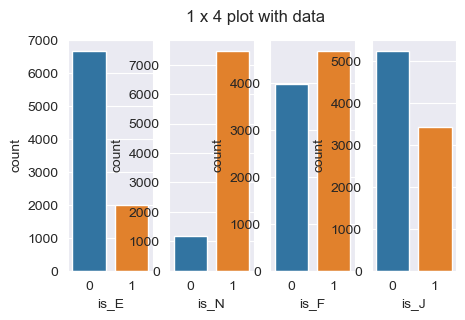

In [25]:
fig, axes = plt.subplots(1, 4, figsize=(5, 3))
fig.suptitle('1 x 4 plot with data')
sns.countplot(ax=axes[0],x=data['is_E'])
sns.countplot(ax=axes[1],x=data['is_N'])
sns.countplot(ax=axes[2],x=data['is_F'])
sns.countplot(ax=axes[3],x=data['is_J'])

<AxesSubplot:xlabel='qe_mark', ylabel='Count'>

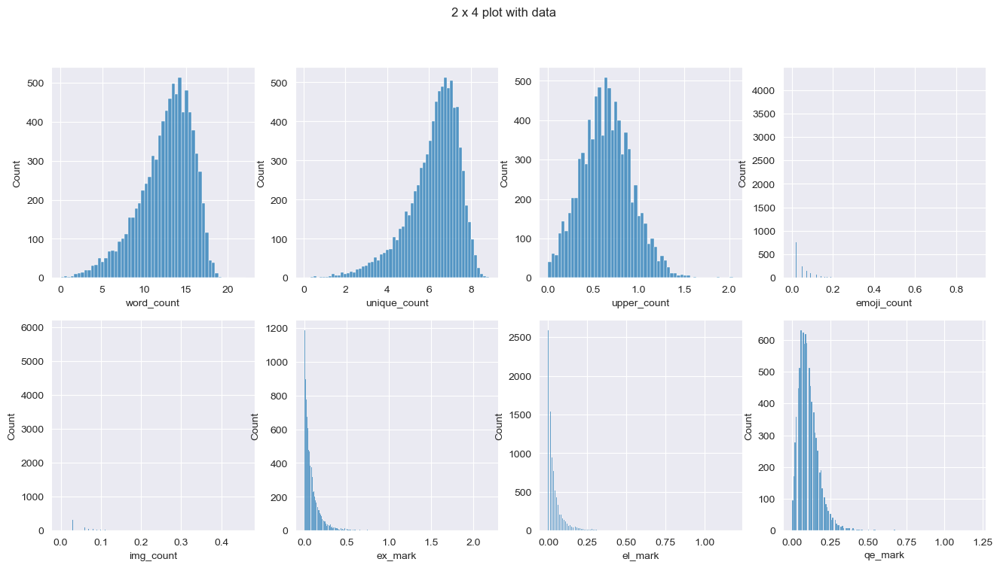

In [26]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('2 x 4 plot with data')
sns.histplot(ax=axes[0,0],data=data, x="word_count")
sns.histplot(ax=axes[0,1],data=data, x="unique_count")
sns.histplot(ax=axes[0,2],data=data, x="upper_count")
sns.histplot(ax=axes[0,3],data=data, x="emoji_count")
sns.histplot(ax=axes[1,0],data=data, x="img_count")
sns.histplot(ax=axes[1,1],data=data, x="ex_mark")
sns.histplot(ax=axes[1,2],data=data, x="el_mark")
sns.histplot(ax=axes[1,3],data=data, x="qe_mark")

<AxesSubplot:xlabel='ex_mark', ylabel='Count'>

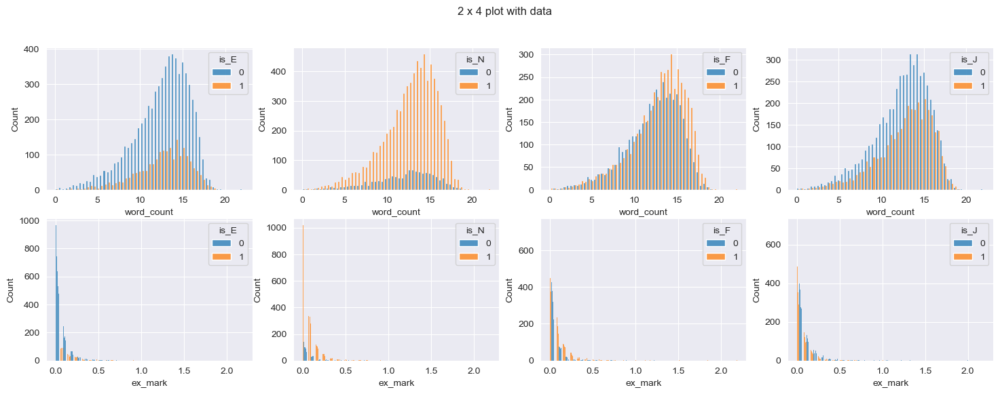

In [27]:
fig, axes = plt.subplots(2, 4, figsize=(18, 6))
fig.suptitle('2 x 4 plot with data')
sns.histplot(ax=axes[0,0], data=data, x="word_count", hue="is_E", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[0,1],data=data, x="word_count", hue="is_N", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[0,2],data=data, x="word_count", hue="is_F", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[0,3],data=data, x="word_count", hue="is_J", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[1,0], data=data, x="ex_mark", hue="is_E", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[1,1],data=data, x="ex_mark", hue="is_N", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[1,2],data=data, x="ex_mark", hue="is_F", multiple="dodge", shrink=.8)
sns.histplot(ax=axes[1,3],data=data, x="ex_mark", hue="is_J", multiple="dodge", shrink=.8)

<AxesSubplot:xlabel='is_J', ylabel='unique_count'>

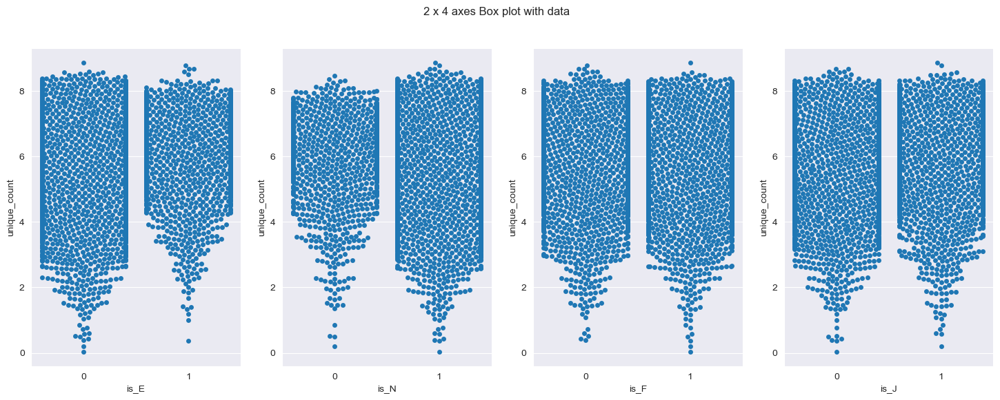

In [28]:
fig, axes = plt.subplots(1, 4, figsize=(18, 6))
fig.suptitle('2 x 4 axes Box plot with data')
sns.swarmplot(ax=axes[0],data=data, x="is_E", y="unique_count")
sns.swarmplot(ax=axes[1],data=data, x="is_N", y="unique_count")
sns.swarmplot(ax=axes[2],data=data, x="is_F", y="unique_count")
sns.swarmplot(ax=axes[3],data=data, x="is_J", y="unique_count")

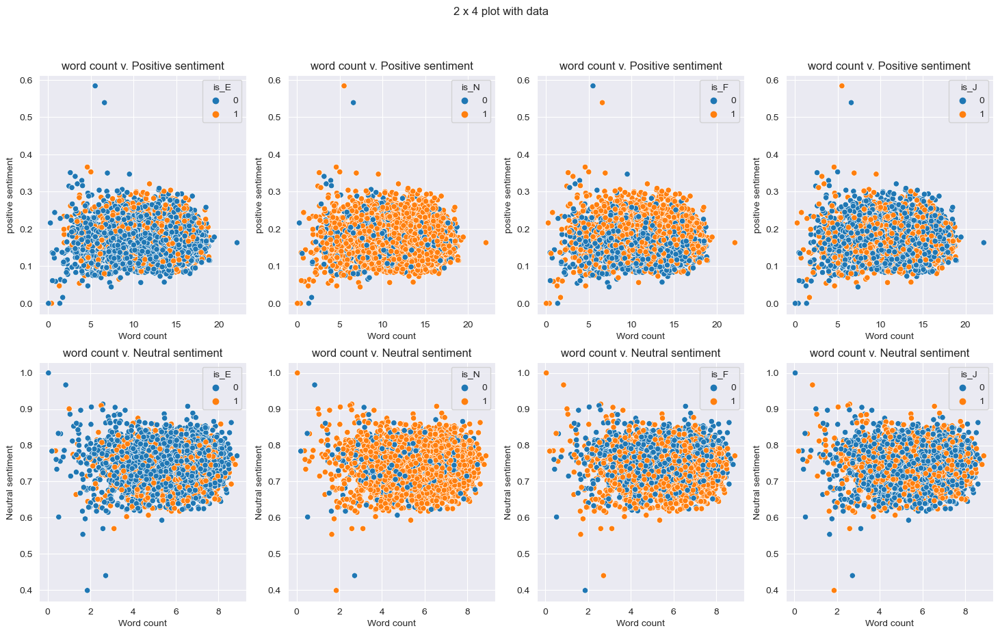

In [29]:
fig, axes = plt.subplots(2, 4, figsize=(18, 10))
fig.suptitle('2 x 4 plot with data')
ax = sns.scatterplot(ax=axes[0, 0],x = "word_count", y = "pos_stmt", hue = "is_E", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "positive sentiment")
ax.set_title("word count v. Positive sentiment")
ax = sns.scatterplot(ax=axes[0, 1],x = "word_count", y = "pos_stmt", hue = "is_N", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "positive sentiment")
ax.set_title("word count v. Positive sentiment")
ax = sns.scatterplot(ax=axes[0, 2],x = "word_count", y = "pos_stmt", hue = "is_F", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "positive sentiment")
ax.set_title("word count v. Positive sentiment")
ax = sns.scatterplot(ax=axes[0, 3],x = "word_count", y = "pos_stmt", hue = "is_J", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "positive sentiment")
ax.set_title("word count v. Positive sentiment")
ax = sns.scatterplot(ax=axes[1, 0],x = "unique_count", y = "neu_stmt", hue = "is_E", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "Neutral sentiment")
ax.set_title("word count v. Neutral sentiment")
ax = sns.scatterplot(ax=axes[1, 1],x = "unique_count", y = "neu_stmt", hue = "is_N", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "Neutral sentiment")
ax.set_title("word count v. Neutral sentiment")
ax = sns.scatterplot(ax=axes[1, 2],x = "unique_count", y = "neu_stmt", hue = "is_F", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "Neutral sentiment")
ax.set_title("word count v. Neutral sentiment")
ax = sns.scatterplot(ax=axes[1, 3],x = "unique_count", y = "neu_stmt", hue = "is_J", palette = "tab10", data = data)
ax.set(xlabel = "Word count",
      ylabel = "Neutral sentiment")
ax.set_title("word count v. Neutral sentiment")
plt.show()

Text(0.5, 1.0, 'img_count')

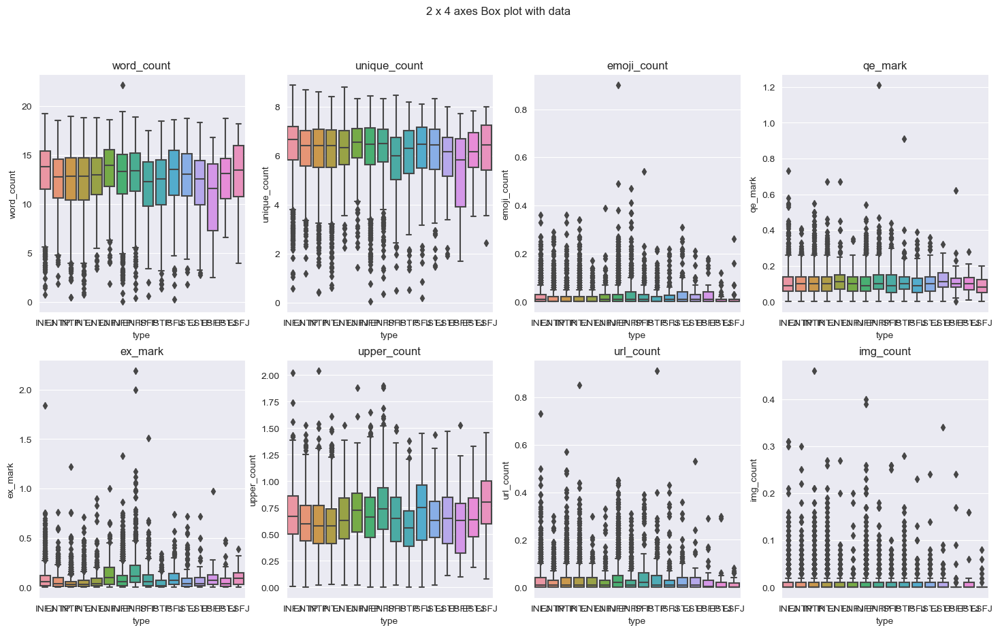

In [31]:
fig, axes = plt.subplots(2, 4, figsize=(18, 10))
fig.suptitle('2 x 4 axes Box plot with data')
a = sns.boxplot(ax=axes[0, 0], data=data, x='type', y='word_count')
a.set_title('word_count')
a = sns.boxplot(ax=axes[0, 1], data=data, x='type', y='unique_count')
a.set_title('unique_count')
a = sns.boxplot(ax=axes[0, 2], data=data, x='type', y='emoji_count')
a.set_title('emoji_count')
a = sns.boxplot(ax=axes[0, 3], data=data, x='type', y='qe_mark')
a.set_title('qe_mark')
a = sns.boxplot(ax=axes[1, 0], data=data, x='type', y='ex_mark')
a.set_title('ex_mark')
a = sns.boxplot(ax=axes[1, 1], data=data, x='type', y='upper_count')
a.set_title('upper_count')
a = sns.boxplot(ax=axes[1, 2], data=data, x='type', y='url_count')
a.set_title('url_count')
a = sns.boxplot(ax=axes[1, 3], data=data, x='type', y='img_count')
a.set_title('img_count')

Text(0.5, 1.0, 'com_stmt')

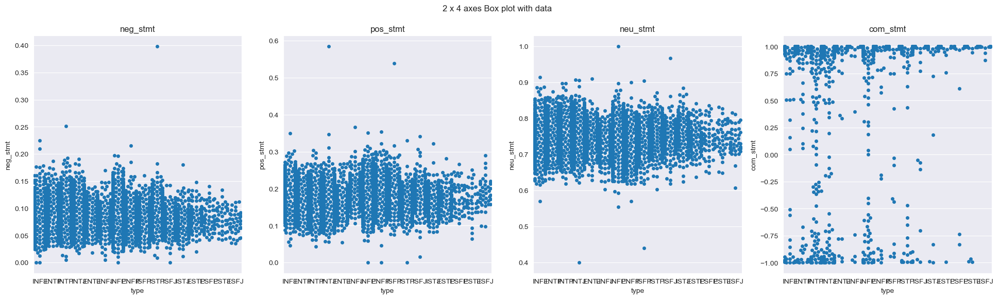

In [32]:
fig, axes = plt.subplots(1, 4, figsize=(24, 6))
fig.suptitle('2 x 4 axes Box plot with data')
a = sns.swarmplot(ax=axes[0],data=data, x="type", y="neg_stmt")
a.set_title('neg_stmt')
a = sns.swarmplot(ax=axes[1],data=data, x="type", y="pos_stmt")
a.set_title('pos_stmt')
a = sns.swarmplot(ax=axes[2],data=data, x="type", y="neu_stmt")
a.set_title('neu_stmt')
a = sns.swarmplot(ax=axes[3],data=data, x="type", y="com_stmt")
a.set_title('com_stmt')

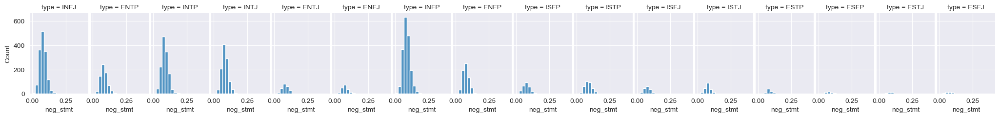

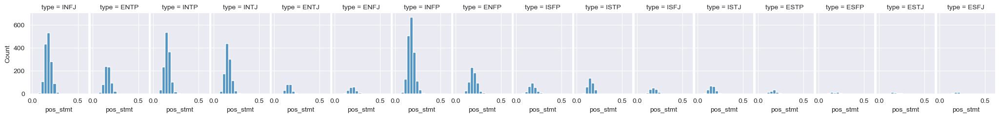

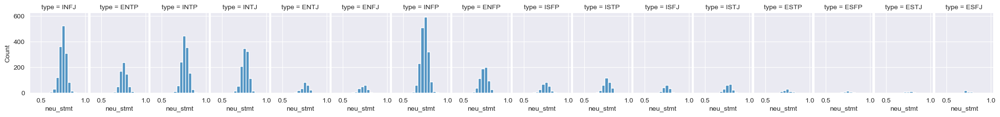

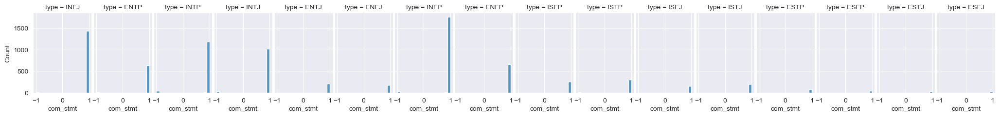

In [33]:
sent_result = ["neg_stmt", "pos_stmt", "neu_stmt", "com_stmt"]
for i in sent_result:
    a = sns.displot(data=data, x= i, kind='hist',
                bins=18, col='type')
    a.figure.set_figwidth(20)
    a.figure.set_figheight(2)

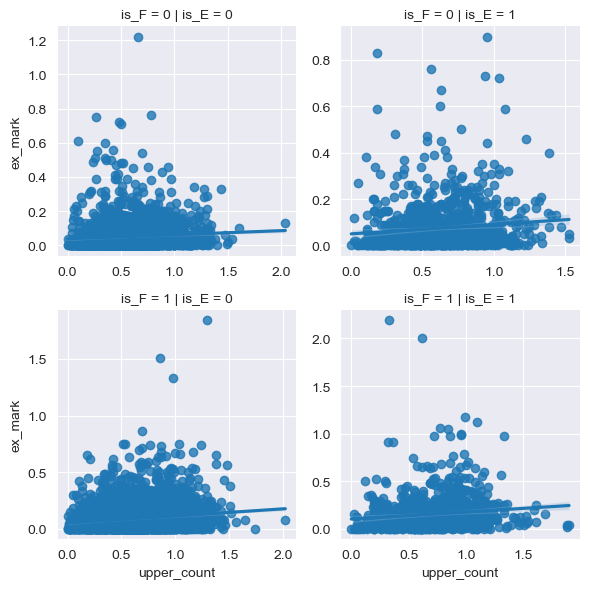

In [30]:
sns.lmplot(
    data=data, x="upper_count", y="ex_mark",
    col="is_E", row="is_F", height=3,
    facet_kws=dict(sharex=False, sharey=False),
)

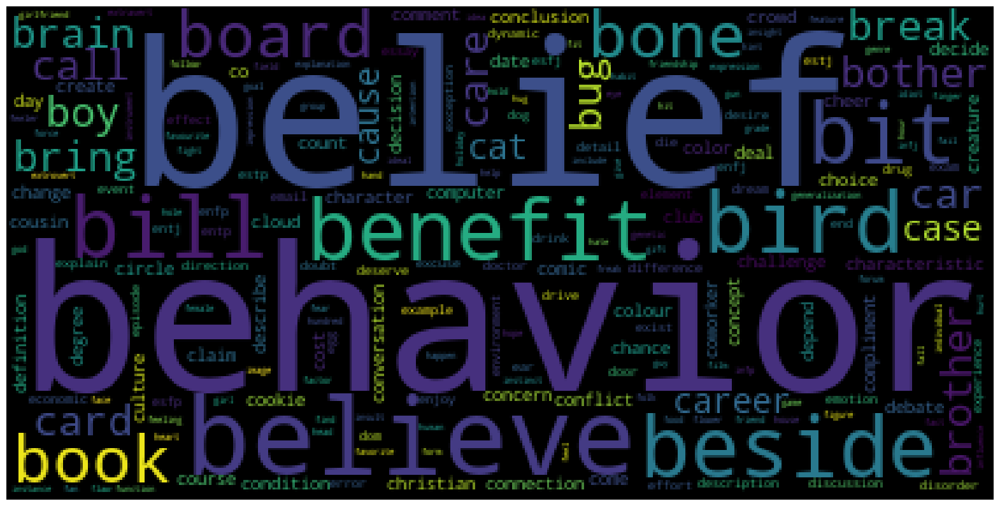

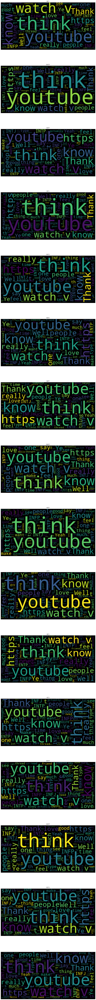

In [35]:
vectorizer=TfidfVectorizer( max_features=5000)
vectorizer.fit(data.cleans)
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[500:3500] ))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)
fig, ax = plt.subplots(len(data['type'].unique()), sharex=True, figsize=(15,10*len(data['type'].unique())))
k = 0
for i in data['type'].unique():
    df_4 = data[data['type'] == i]
    wordcloud = WordCloud().generate(data['posts'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(i)
    ax[k].axis("off")
    k+=1

INFJ


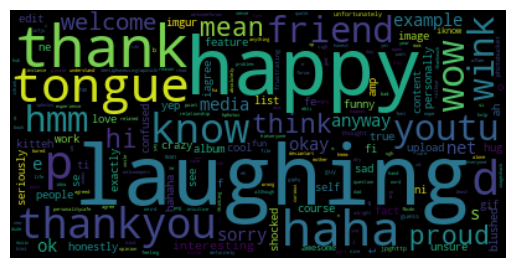

ENTP


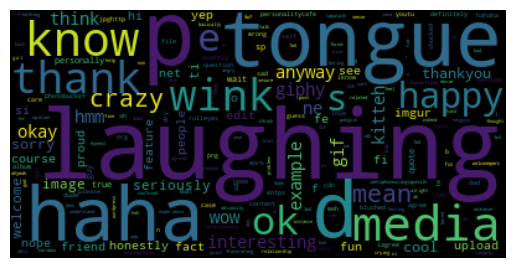

INTP


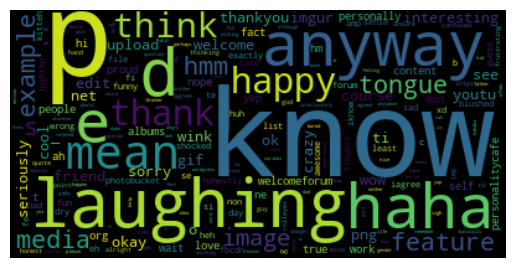

INTJ


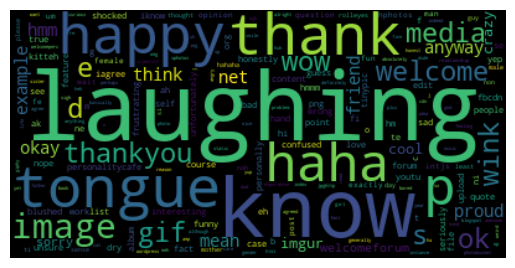

ENTJ


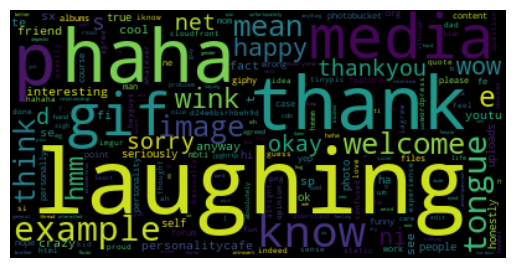

ENFJ


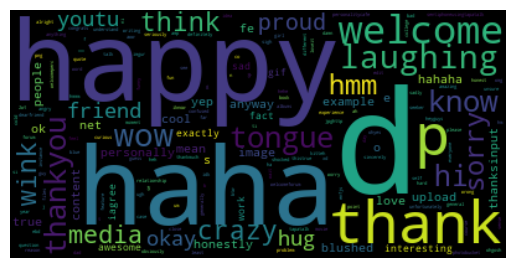

INFP


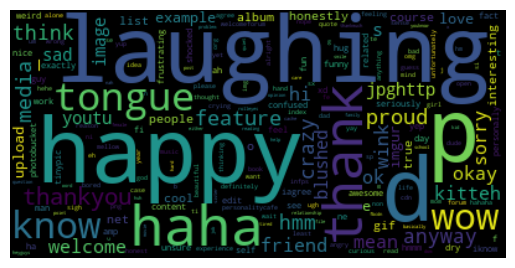

ENFP


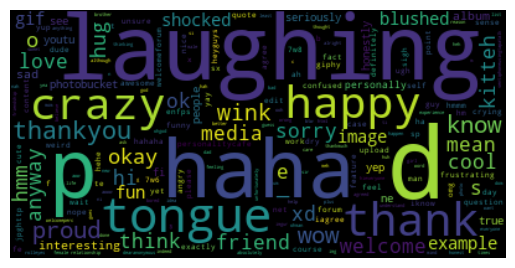

ISFP


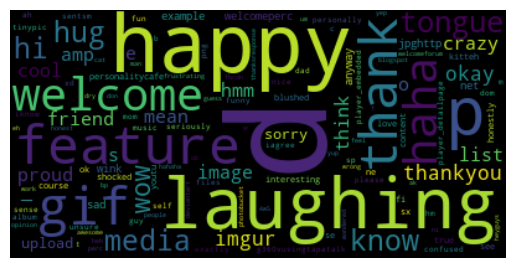

ISTP


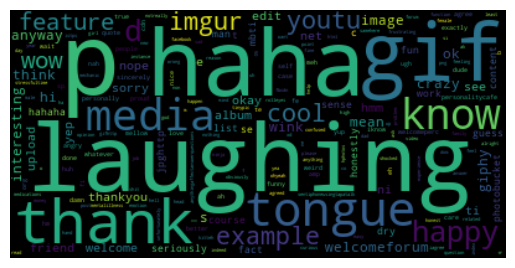

ISFJ


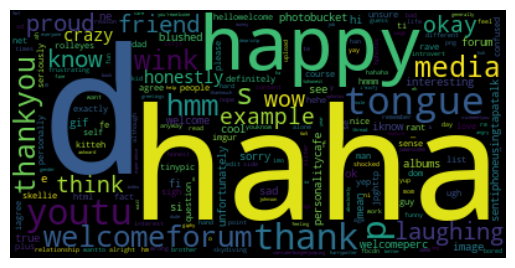

ISTJ


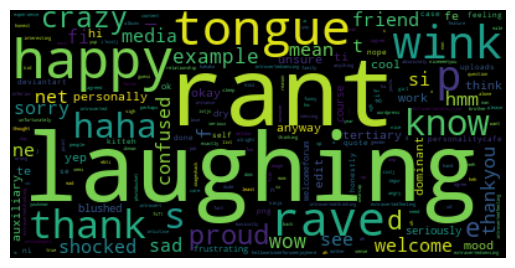

ESTP


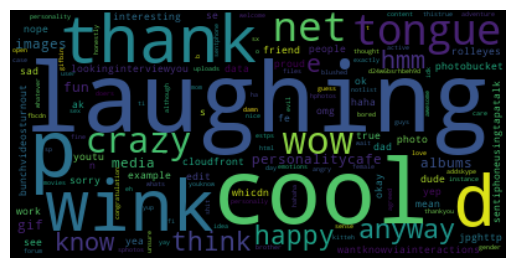

ESFP


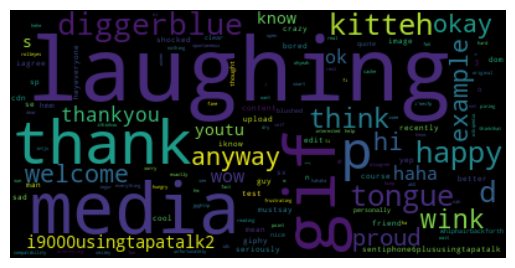

ESTJ


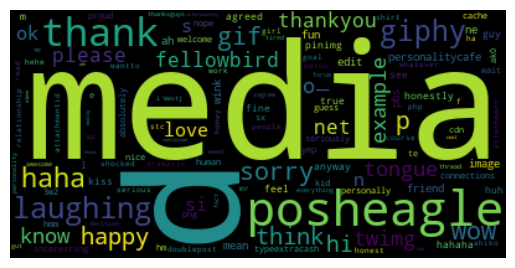

ESFJ


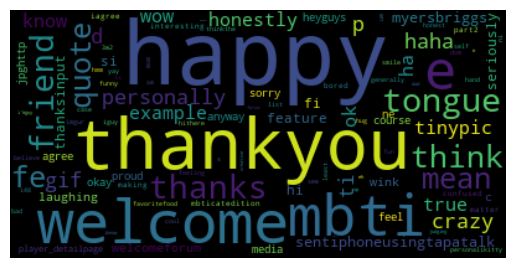

In [36]:
#word cloud after cleaning stop words
names = data['type'].unique()
stopWords = set(STOPWORDS)
#add each lower case personality type as a stopword
for word in names:
    word.lower()
    stopWords.add(word.lower())
#Remove all of the most common words
moreWords =['hello', 'hey', 'etc', 'lol', 'oh', 'V', 'lot', 'time', 'actually', 'seem', 'actually', 'pretty', 'sure','type', 'one', 'even', 'someone', 'thing','make',
            'now', 'things',  'i', '-', "much", "something", "will", "find", "go", "going", 'still', 'though',
            'always', 'through', 'lot', 'really', 'way', 'never', 'say', 'it.', 'me.', 'many', 'first', 'wp', 'go',
            'really', 'much', 'youtube', 'right', 'tumblr', 'great', 'say', 'well', 'will', 'something', 'way',
            'especially', 'good', 'ye', 'person', 'https', 'watch', 'yes', 'got', 'take', 'person', 'might', 'me', 'me,', 'around', 'best', 'try',
            'maybe', 'usually', 'sometimes', 'trying', 'us', 'may', 'use', 'said', 'two', 'makes', 'little', 'quite', 'u', 'probably', 'made', 'it', 'seems', 'look', 'yeah',
            'come', 'it,', 'look', 'kind', 'every', 'long', 'tell', 'jpg']
for i in moreWords:
    stopWords.add(i)
i = 0
while i < len(names):
    for name in names:
        print(name)
        #filter by type
        specRows = data['type'] == name
        #combine the rows by type
        nameReturn = "".join(post for post in data[data["type"]== name].posts)
        nameReturn = nameReturn.lower()
        #make into a list to use comprehension to remove stopwords
        split = nameReturn.split()
        filtered_list = [word for word in split if word not in stopWords]
        filtered_words = "".join(filtered_list)
        #collocations = false to prevent duplicate words
        wordcloud = WordCloud(stopwords=stopWords, collocations=False).generate(filtered_words)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        i +=1